In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [18]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Our algorithms, by from the easiest to the hardest to intepret.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier

In [4]:
data = pd.read_csv("./Datasets/bank/bank-additional-full.csv",  sep = ';')

In [5]:
data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [7]:
data.y.value_counts()

no     36548
yes     4640
Name: y, dtype: int64

In [9]:
#cat to num values and mark y as labels and remaining as features
y = data["y"].map({"no":0, "yes":1})
X = data.drop("y", axis=1)

In [12]:
y

0        0
1        0
2        0
3        0
4        0
        ..
41183    1
41184    0
41185    0
41186    1
41187    0
Name: y, Length: 41188, dtype: int64

In [13]:
X

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6


In [14]:
X.drop("duration", inplace=True, axis=1)

In [15]:
X.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
dtype: object

In [16]:
# Some such as default would be binary features, but since
# they have a third class "unknown" we'll process them as non binary categorical
num_features = ["age", "campaign", "pdays", "previous", "emp.var.rate", 
                "cons.price.idx", "cons.conf.idx","euribor3m", "nr.employed"]

cat_features = ["job", "marital", "education","default", "housing", "loan",
                "contact", "month", "day_of_week", "poutcome"]

In [19]:
preprocessor = ColumnTransformer([("numerical", "passthrough", num_features), 
                                  ("categorical", OneHotEncoder(sparse=False, handle_unknown="ignore"),
                                   cat_features)])

In [20]:
# Logistic Regression
lr_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", LogisticRegression(class_weight="balanced", solver="liblinear", random_state=42))])

In [21]:
# Decision Tree
dt_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", DecisionTreeClassifier(class_weight="balanced"))])

In [22]:
# Random Forest
rf_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", RandomForestClassifier(class_weight="balanced", n_estimators=100, n_jobs=-1))])

In [23]:
# XGBoost
xgb_model = Pipeline([("preprocessor", preprocessor), 
                      # Add a scale_pos_weight to make it balanced
                      ("model", XGBClassifier(scale_pos_weight=(1 - y.mean()), n_jobs=-1))])

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=.3, random_state=42)

In [26]:


gs = GridSearchCV(lr_model, {"model__C": [1, 1.3, 1.5]}, n_jobs=-1, cv=5, scoring="accuracy")
gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                          

In [27]:
print(gs.best_params_)
print(gs.best_score_)

{'model__C': 1.3}
0.8277895321008637


In [28]:
lr_model.set_params(**gs.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(categorical_features=None,
                                                                cate...
                                                   'education', 'default',
    

In [29]:
lr_model.get_params("model")

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                     transformer_weights=None,
                     transformers=[('numerical', 'passthrough',
                                    ['age', 'campaign', 'pdays', 'previous',
                                     'emp.var.rate', 'cons.price.idx',
                                     'cons.conf.idx', 'euribor3m',
                                     'nr.employed']),
                                   ('categorical',
                                    OneHotEncoder(categorical_features=None,
                                                  categories=None, drop=None,
                                                  dtype=<class 'numpy.float64'>,
                                                  handle_unknown='ignore',
                                                  n_values=None, sparse=False),
                                    ['job', 'marital', 'edu

In [30]:
lr_model.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(categorical_features=None,
                                                                cate...
                                                   'education', 'default',
    

In [31]:
y_pred = lr_model.predict(X_test)

In [32]:
accuracy_score(y_test, y_pred)

0.8322408351541636

In [33]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.86      0.90     10965
           1       0.36      0.64      0.46      1392

    accuracy                           0.83     12357
   macro avg       0.66      0.75      0.68     12357
weighted avg       0.88      0.83      0.85     12357



In [34]:
import eli5
eli5.show_weights(lr_model.named_steps["model"])

Using TensorFlow backend.


Weight?,Feature
+1.033,x49
+0.707,x7
+0.607,x5
+0.574,x29
+0.397,x24
+0.370,x14
+0.308,x46
+0.280,x45
+0.241,x42
+0.210,x61


In [35]:
preprocessor = lr_model.named_steps["preprocessor"]

In [36]:
ohe_categories = preprocessor.named_transformers_["categorical"].categories_

In [37]:
new_ohe_features = [f"{col}__{val}" for col, vals in zip(cat_features, ohe_categories) for val in vals]

In [38]:
all_features = num_features + new_ohe_features

In [39]:
pd.DataFrame(lr_model.named_steps["preprocessor"].transform(X_train), columns=all_features).head()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job__admin.,...,month__oct,month__sep,day_of_week__fri,day_of_week__mon,day_of_week__thu,day_of_week__tue,day_of_week__wed,poutcome__failure,poutcome__nonexistent,poutcome__success
0,50.0,2.0,999.0,0.0,1.1,93.994,-36.4,4.860,5191.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,51.0,5.0,999.0,0.0,1.1,93.994,-36.4,4.858,5191.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,46.0,2.0,999.0,0.0,-1.8,92.893,-46.2,1.244,5099.1,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,46.0,1.0,999.0,0.0,1.4,94.465,-41.8,4.961,5228.1,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,25.0,5.0,999.0,0.0,-1.8,92.893,-46.2,1.266,5099.1,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [40]:
eli5.show_weights(lr_model.named_steps["model"], feature_names=all_features)

Weight?,Feature
+1.033,month__mar
+0.707,euribor3m
+0.607,cons.price.idx
+0.574,education__illiterate
+0.397,marital__unknown
+0.370,job__retired
+0.308,month__dec
+0.280,month__aug
+0.241,contact__cellular
+0.210,poutcome__success


In [42]:
i = 4
X_test.iloc[[i]]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
39993,27,unknown,single,university.degree,no,yes,no,cellular,jun,wed,4,3,2,success,-1.7,94.055,-39.8,0.767,4991.6


In [43]:
y_test.iloc[i]

1

In [44]:
eli5.show_prediction(lr_model.named_steps["model"], 
                     lr_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

In [45]:
gs = GridSearchCV(dt_model, {"model__max_depth": [3, 5, 7], 
                             "model__min_samples_split": [2, 5]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                          

In [46]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 5, 'model__min_samples_split': 2}
0.8510284069231036


In [47]:
dt_model.set_params(**gs.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(categorical_features=None,
                                                                cate...
                                                   'month', 'day_of_week',
    

In [48]:
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)

In [49]:
accuracy_score(y_test, y_pred)

0.8553856113943514

In [50]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.89      0.92     10965
           1       0.41      0.62      0.49      1392

    accuracy                           0.86     12357
   macro avg       0.68      0.75      0.70     12357
weighted avg       0.89      0.86      0.87     12357



In [51]:
eli5.show_weights(dt_model.named_steps["model"], feature_names=all_features)

Weight,Feature
0.7088,nr.employed
0.1340,cons.conf.idx
0.0488,cons.price.idx
0.0338,pdays
0.0211,month__oct
0.0194,euribor3m
0.0125,default__unknown
0.0081,poutcome__failure
0.0045,contact__telephone
0.0042,campaign


In [52]:
eli5.show_prediction(dt_model.named_steps["model"], 
                     dt_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

# LIME to generate local intepretations of black box models

In [54]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15], 
                             "model__min_samples_split": [5, 10]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                          

In [55]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.874926294613437


In [56]:
rf_model.set_params(**gs.best_params_)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(categorical_features=None,
                                                                cate...
                 RandomForestClassifier(bootstrap=True, class_weight='balanced'

In [57]:
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [58]:
accuracy_score(y_test, y_pred)

0.8799870518734321

In [60]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93     10965
           1       0.47      0.57      0.52      1392

    accuracy                           0.88     12357
   macro avg       0.71      0.75      0.73     12357
weighted avg       0.89      0.88      0.88     12357



In [61]:
eli5.show_weights(rf_model.named_steps["model"], 
                  feature_names=all_features)

Weight,Feature
0.1382 ± 0.2304,euribor3m
0.1138 ± 0.2752,nr.employed
0.0946 ± 0.2504,emp.var.rate
0.0689 ± 0.0289,age
0.0489 ± 0.1171,cons.price.idx
0.0430 ± 0.1097,cons.conf.idx
0.0404 ± 0.0159,campaign
0.0390 ± 0.1235,pdays
0.0283 ± 0.1126,poutcome__success
0.0177 ± 0.0610,previous


In [62]:
gs = GridSearchCV(xgb_model, {"model__max_depth": [5, 10],
                              "model__min_child_weight": [5, 10],
                              "model__n_estimators": [25]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('preprocessor',
                                        ColumnTransformer(n_jobs=None,
                                                          remainder='drop',
                                                          sparse_threshold=0.3,
                                                          transformer_weights=None,
                                                          transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                          

In [63]:
print(gs.best_params_)
print(gs.best_score_)
xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

{'model__max_depth': 5, 'model__min_child_weight': 10, 'model__n_estimators': 25}
0.9001075231521626


Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(categorical_features=None,
                                                                cate...
                               learning_rate=0.300000012, max_delta_step=0,
   

In [64]:
y_pred = xgb_model.predict(X_test)


In [65]:
accuracy_score(y_test, y_pred)

0.9012705349194788

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95     10965
           1       0.68      0.23      0.35      1392

    accuracy                           0.90     12357
   macro avg       0.80      0.61      0.65     12357
weighted avg       0.88      0.90      0.88     12357



In [71]:
from lime.lime_tabular import LimeTabularExplainer

In [72]:
categorical_names = {}
for col in cat_features:
    categorical_names[X_train.columns.get_loc(col)] = [new_col.split("__")[1] 
                                                       for new_col in new_ohe_features 
                                                       if new_col.split("__")[0] == col]

In [73]:
categorical_names

{1: ['admin.',
  'blue-collar',
  'entrepreneur',
  'housemaid',
  'management',
  'retired',
  'self-employed',
  'services',
  'student',
  'technician',
  'unemployed',
  'unknown'],
 2: ['divorced', 'married', 'single', 'unknown'],
 3: ['basic.4y',
  'basic.6y',
  'basic.9y',
  'high.school',
  'illiterate',
  'professional.course',
  'university.degree',
  'unknown'],
 4: ['no', 'unknown', 'yes'],
 5: ['no', 'unknown', 'yes'],
 6: ['no', 'unknown', 'yes'],
 7: ['cellular', 'telephone'],
 8: ['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep'],
 9: ['fri', 'mon', 'thu', 'tue', 'wed'],
 13: ['failure', 'nonexistent', 'success']}

In [74]:
def convert_to_lime_format(X, categorical_names, col_names=None, invert=False):
    """Converts data with categorical values as string into the right format 
    for LIME, with categorical values as integers labels.

    It takes categorical_names, the same dictionary that has to be passed
    to LIME to ensure consistency. 

    col_names and invert allow to rebuild the original dataFrame from
    a numpy array in LIME format to be passed to a Pipeline or sklearn
    OneHotEncoder
    """

    # If the data isn't a dataframe, we need to be able to build it
    if not isinstance(X, pd.DataFrame):
        X_lime = pd.DataFrame(X, columns=col_names)
    else:
        X_lime = X.copy()

    for k, v in categorical_names.items():
        if not invert:
            label_map = {
                str_label: int_label for int_label, str_label in enumerate(v)
            }
        else:
            label_map = {
                int_label: str_label for int_label, str_label in enumerate(v)
            }

        X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)

    return X_lime

In [75]:

convert_to_lime_format(X_train, categorical_names).head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
7309,50,1,2,0,0,0,0,1,6,2,2,999,0,1,1.1,93.994,-36.4,4.860,5191.0
4169,51,7,1,5,1,0,0,1,6,1,5,999,0,1,1.1,93.994,-36.4,4.858,5191.0
35810,46,9,0,5,0,2,0,0,6,1,2,999,0,1,-1.8,92.893,-46.2,1.244,5099.1
9668,46,0,2,6,0,2,0,1,4,1,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1
34389,25,7,2,3,0,0,0,0,6,2,5,999,0,1,-1.8,92.893,-46.2,1.266,5099.1


In [76]:
explainer = LimeTabularExplainer(convert_to_lime_format(X_train, categorical_names).values,
                                 mode="classification",
                                 feature_names=X_train.columns.tolist(),
                                 categorical_names=categorical_names,
                                 categorical_features=categorical_names.keys(),
                                 discretize_continuous=True,
                                 random_state=42)

In [77]:
i = 2
X_observation = X_test.iloc[[i], :]
X_observation

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
12077,35,technician,single,professional.course,no,no,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.947,5228.1


In [78]:
print(f"""\
* True label: {y_test.iloc[i]}
* LR: {lr_model.predict_proba(X_observation)[0]}
* DT: {dt_model.predict_proba(X_observation)[0]}
* RF: {rf_model.predict_proba(X_observation)[0]}
* XGB: {xgb_model.predict_proba(X_observation)[0]}""")

* True label: 0
* LR: [0.71207688 0.28792312]
* DT: [0.75848014 0.24151986]
* RF: [0.84883561 0.15116439]
* XGB: [0.96021694 0.03978304]


In [79]:
observation = convert_to_lime_format(X_test.iloc[[i], :],categorical_names).values[0]
observation

array([ 3.5000e+01,  9.0000e+00,  2.0000e+00,  5.0000e+00,  0.0000e+00,
        0.0000e+00,  0.0000e+00,  1.0000e+00,  4.0000e+00,  0.0000e+00,
        1.0000e+00,  9.9900e+02,  0.0000e+00,  1.0000e+00,  1.4000e+00,
        9.4465e+01, -4.1800e+01,  4.9470e+00,  5.2281e+03])

In [80]:
# Let write a custom predict_proba functions for our models:
from functools import partial

def custom_predict_proba(X, model):
    X_str = convert_to_lime_format(X, categorical_names, col_names=X_train.columns, invert=True)
    return model.predict_proba(X_str)

In [81]:
lr_predict_proba = partial(custom_predict_proba, model=lr_model)
dt_predict_proba = partial(custom_predict_proba, model=dt_model)
rf_predict_proba = partial(custom_predict_proba, model=rf_model)
xgb_predict_proba = partial(custom_predict_proba, model=xgb_model)

In [82]:
explanation = explainer.explain_instance(observation, lr_predict_proba, num_features=5)

In [83]:
explanation.show_in_notebook(show_table=True, show_all=False)

In [84]:
explanation.save_to_file("explanation.html")

In [85]:
print(explanation.local_exp)
print(explanation.intercept)
print(explanation.score)

{1: [(14, -0.33684161474635355), (17, 0.1944577246405866), (18, -0.18067297273703659), (15, 0.09887480820164823), (7, -0.0693478065800364)]}
{1: 0.6708944481030126}
0.4128498281215625


In [86]:
explanation = explainer.explain_instance(observation, dt_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.16639642600570392


In [87]:
explanation = explainer.explain_instance(observation, rf_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.3795787939652474


In [88]:
explanation = explainer.explain_instance(observation, xgb_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.23976769313604174


# More local interpretation with SHAP

In [89]:
import shap
# Need to load JS vis in the notebook
shap.initjs() 


SHAP has a generic explainer that works for any model and a TreeExplainer optimised for tree based models. Here we will focus on the TreeExplainer with our XGB model (the hardest to intepret)

In [90]:
explainer = shap.TreeExplainer(xgb_model.named_steps["model"])

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [91]:
observations = xgb_model.named_steps["preprocessor"].transform(X_train.sample(1000, random_state=42))
shap_values = explainer.shap_values(observations)

In [92]:
i = 0
shap.force_plot(explainer.expected_value, shap_values[i], 
                features=observations[i], feature_names=all_features)

In [93]:
shap.force_plot(explainer.expected_value, shap_values,
                features=observations, feature_names=all_features)

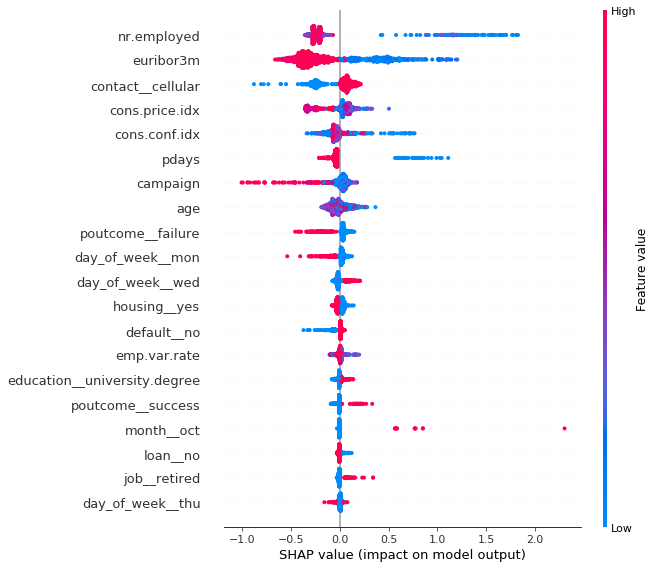

In [94]:
shap.summary_plot(shap_values, features=observations, feature_names=all_features)

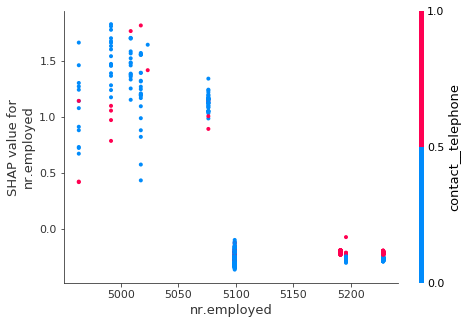

In [95]:
shap.dependence_plot("nr.employed", shap_values, 
                     pd.DataFrame(observations, columns=all_features))